Calculate the Bayes Factor for $u-r$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'nsa_v1_0_1_VAGC_vflag-V2_sys.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
ur_NSA = np.array(catalog_main['u_r'])

# Separate galaxies by their $V^2$ LSS classifications

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

In [6]:
wall_noRmin = catalog_main['vflag_V2_noRmin'] == 0
void_noRmin = catalog_main['vflag_V2_noRmin'] == 1
edge_noRmin = catalog_main['vflag_V2_noRmin'] == 2
out_noRmin = catalog_main['vflag_V2_noRmin'] == 9

## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [7]:
wall_0p1 = catalog_main['vflag_V2_0p1rho'] == 0
void_0p1 = catalog_main['vflag_V2_0p1rho'] == 1
edge_0p1 = catalog_main['vflag_V2_0p1rho'] == 2
out_0p1 = catalog_main['vflag_V2_0p1rho'] == 9

## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [8]:
wall_0p3 = catalog_main['vflag_V2_0p3rho'] == 0
void_0p3 = catalog_main['vflag_V2_0p3rho'] == 1
edge_0p3 = catalog_main['vflag_V2_0p3rho'] == 2
out_0p3 = catalog_main['vflag_V2_0p3rho'] == 9

In [9]:
del catalog_main, catalog_north, data

# Fit the color distributions with skewnormal distributions

Both one- and two-parent models

This is a bimodal distribution

In [10]:
ur_bins = np.arange(0.5, 4, 0.05)

In [11]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

labels1_tri = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                    'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$', 
                    'c', r'$\mu_c$', r'$\sigma_c$', 'skew$_c$']
labels2_tri = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
               '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
               '$c_2$', r'$\mu_{1c}$', r'$\sigma_{1c}$', 'skew$_{1c}$', 
               '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
               '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$', 
               '$c_2$', r'$\mu_{2c}$', r'$\sigma_{2c}$', 'skew$_{2c}$']

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

### 1-parent model

In [14]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-noRmin.pickle', 'rb')
V2noRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

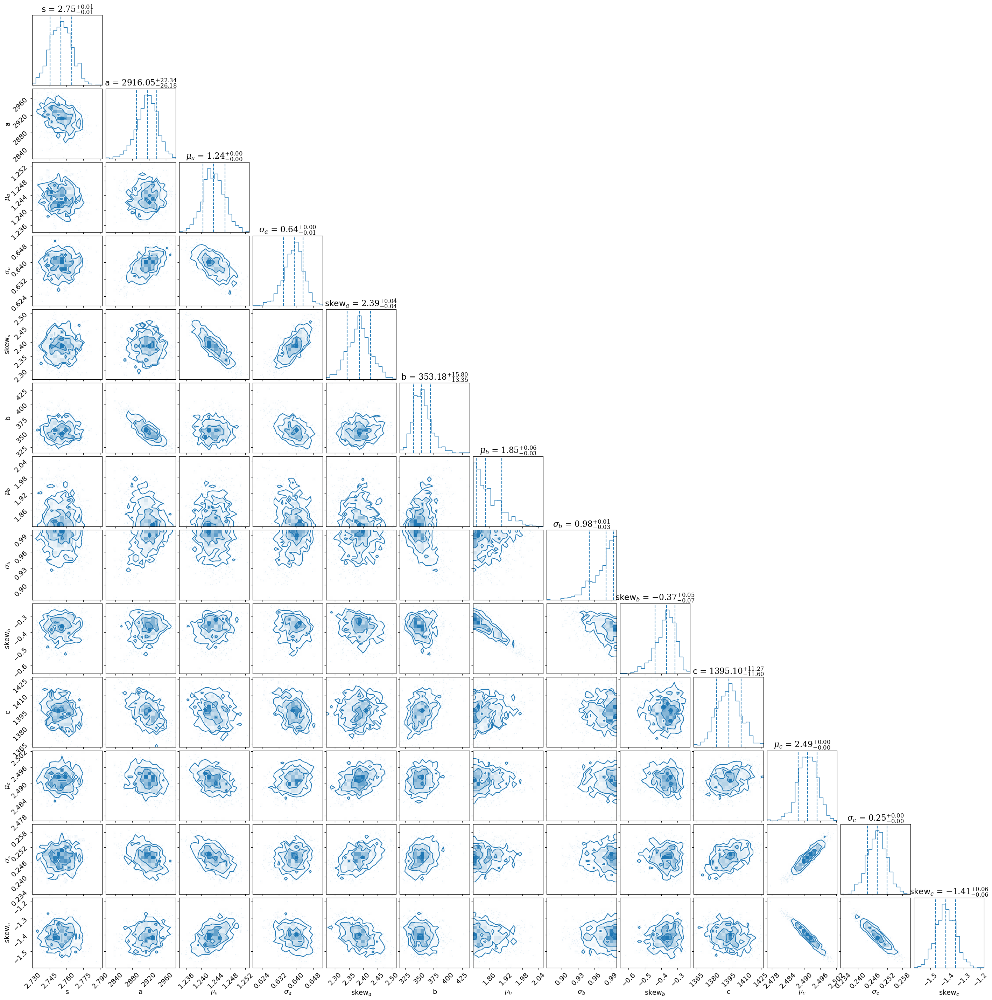

In [15]:
pc.plotting.corner(V2noRmin_results1, 
                   labels=labels1_tri, 
                   dims=range(len(labels1_tri)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [22]:
lnzM1_V2noRmin = V2noRmin_results1['logz'][-1]
lnzM1_V2noRmin

-1939.8448951901498

In [23]:
V2noRmin_gr_bestfit1 = np.mean(V2noRmin_results1['samples'], axis=0)

V2noRmin_gr_bestfit1

array([ 2.7547753e+00,  1.1876072e+03,  4.7007999e-01,  1.6148151e-01,
        6.0855919e-01,  6.6551929e+02,  7.6866478e-01,  5.8490369e-02,
       -1.5650362e+00], dtype=float32)

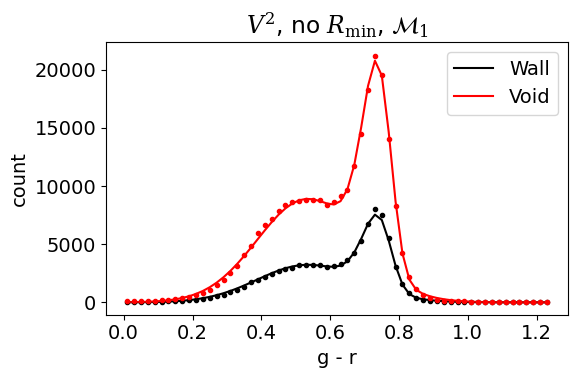

In [27]:
Model_1_plot(V2noRmin_gr_bestfit1, 
             gr_NSA[wall_noRmin], 
             gr_NSA[void_noRmin], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$')

### 2-parent model

In [28]:
temp_infile = open('pocoMC_results/sampler_results_M2_g-r_V2-noRmin.pickle', 'rb')
V2noRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

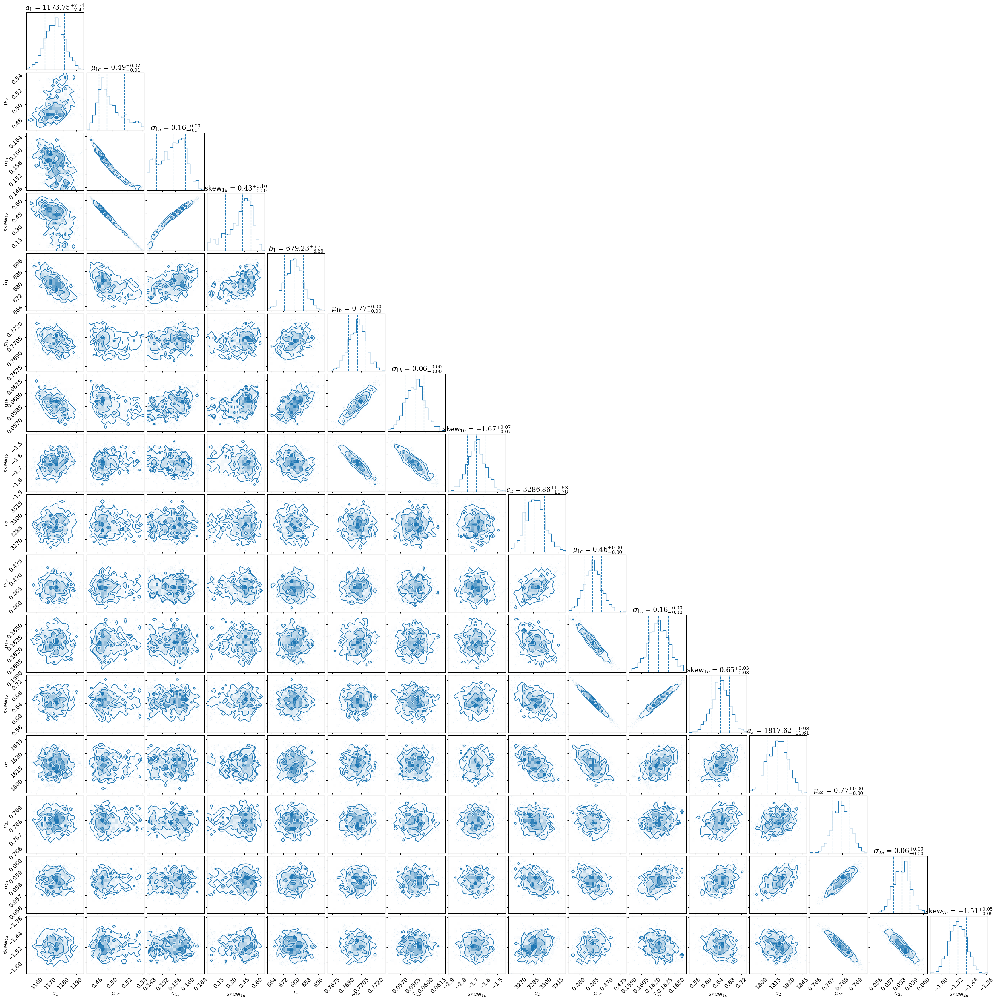

In [30]:
pc.plotting.corner(V2noRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [31]:
lnzM2_V2noRmin = V2noRmin_results2['logz'][-1]
lnzM1_V2noRmin

-1939.8448951901498

In [32]:
V2noRmin_gr_bestfit2 = np.mean(V2noRmin_results2['samples'], axis=0)

V2noRmin_gr_bestfit2

array([ 1.1736178e+03,  4.9704173e-01,  1.5507172e-01,  3.9014748e-01,
        6.7927887e+02,  7.7008516e-01,  5.8727548e-02, -1.6737871e+00,
        3.2872893e+03,  4.6501201e-01,  1.6268478e-01,  6.4751410e-01,
        1.8174089e+03,  7.6792681e-01,  5.8187526e-02, -1.5114957e+00],
      dtype=float32)

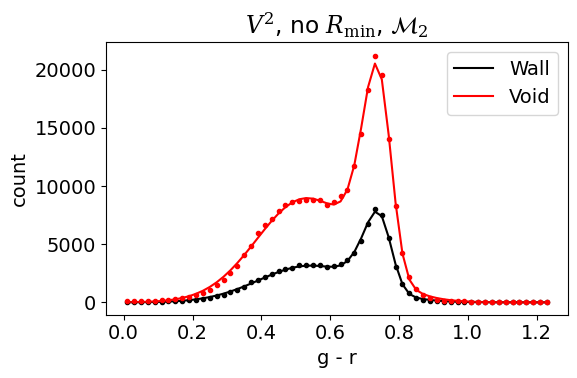

In [34]:
Model_2_plot(V2noRmin_gr_bestfit2, 
             gr_NSA[wall_noRmin], 
             gr_NSA[void_noRmin], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [35]:
lnB12_V2noRmin = lnzM1_V2noRmin - lnzM2_V2noRmin

B12_V2noRmin = np.exp(lnB12_V2noRmin)

print('V2 g-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2noRmin, lnB12_V2noRmin*np.log10(np.exp(1))))

V2 g-r: B12 = 1.1e-28; log(B12) = -27.959


## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [60]:
temp_infile = open('pocoMC_results/sampler_results_M1_g-r_V2-0p1.pickle', 'rb')
V2_0p1_results1 = pickle.load(temp_infile)
temp_infile.close()

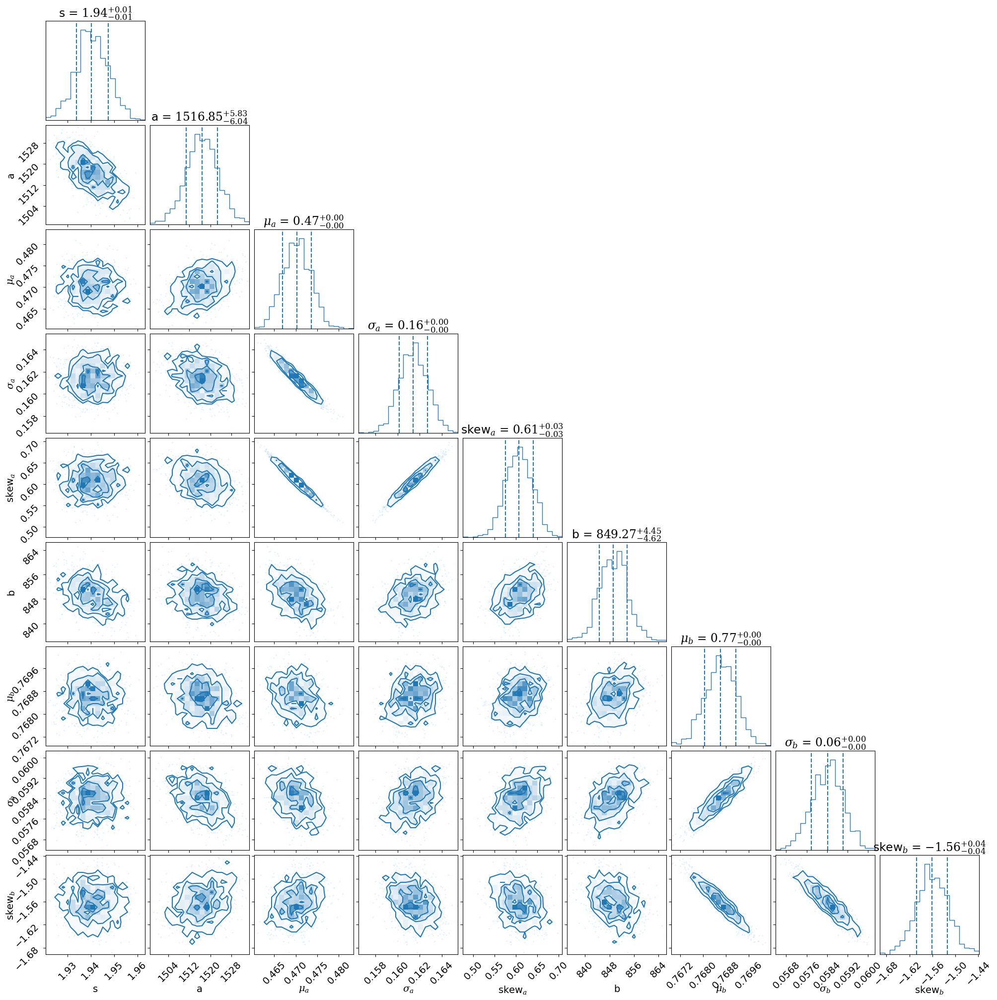

In [63]:
pc.plotting.corner(V2_0p1_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [64]:
lnzM1_V2_0p1 = V2_0p1_results1['logz'][-1]
lnzM1_V2_0p1

-1860.8239225675534

In [65]:
V2_0p1_gr_bestfit1 = np.mean(V2_0p1_results1['samples'], axis=0)

V2_0p1_gr_bestfit1

array([ 1.9405584e+00,  1.5168021e+03,  4.7025412e-01,  1.6141939e-01,
        6.0710502e-01,  8.4932214e+02,  7.6860231e-01,  5.8411721e-02,
       -1.5606720e+00], dtype=float32)

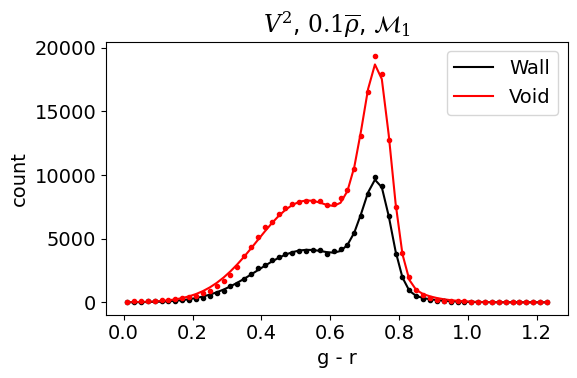

In [78]:
Model_1_plot(V2_0p1_gr_bestfit1, 
             gr_NSA[wall_0p1], 
             gr_NSA[void_0p1], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [72]:
temp_infile = open('pocoMC_results/sampler_results_M2_g-r_V2-0p1.pickle', 'rb')
V2_0p1_results2 = pickle.load(temp_infile)
temp_infile.close()

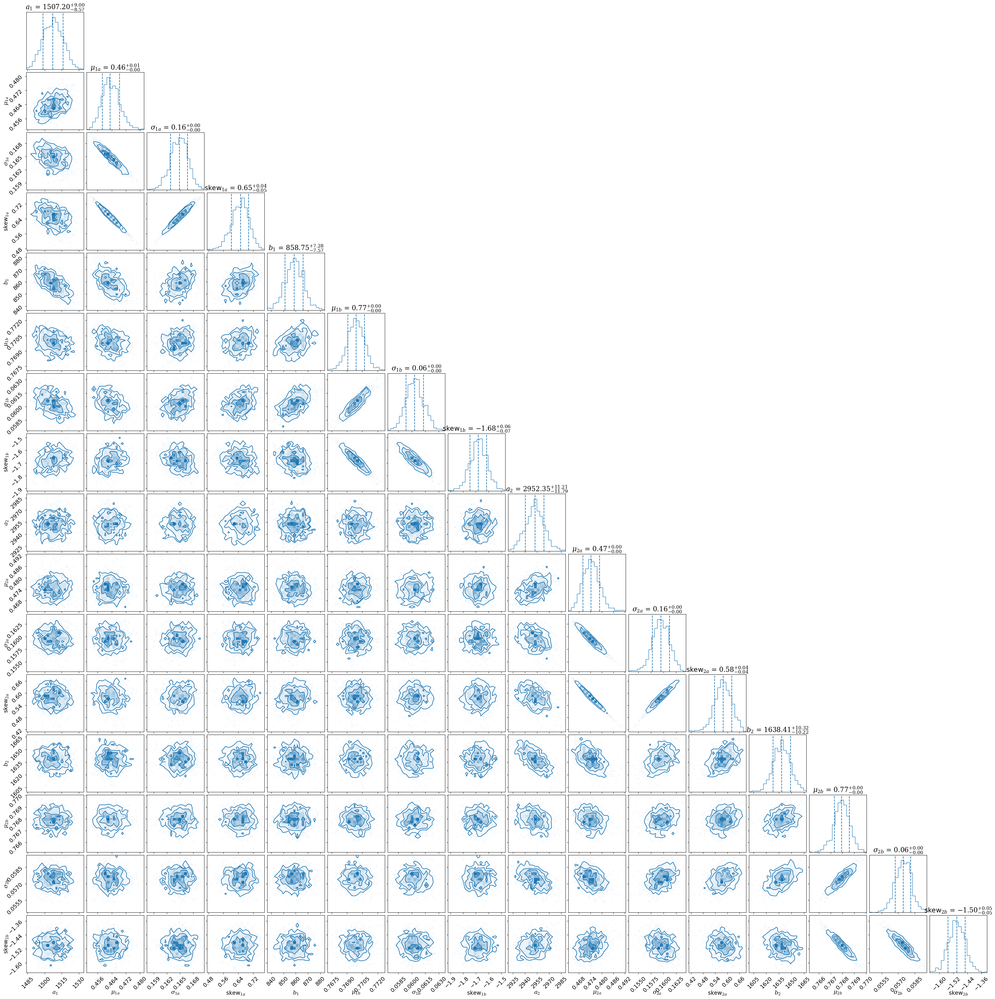

In [73]:
pc.plotting.corner(V2_0p1_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [74]:
lnzM2_V2_0p1 = V2_0p1_results2['logz'][-1]
lnzM1_V2_0p1

-1860.8239225675534

In [75]:
V2_0p1_gr_bestfit2 = np.mean(V2_0p1_results2['samples'], axis=0)

V2_0p1_gr_bestfit2

array([ 1.5072719e+03,  4.6358502e-01,  1.6477145e-01,  6.4870405e-01,
        8.5880975e+02,  7.6987761e-01,  6.0328182e-02, -1.6785363e+00,
        2.9522017e+03,  4.7450331e-01,  1.5943788e-01,  5.7811409e-01,
        1.6383627e+03,  7.6792496e-01,  5.7445362e-02, -1.5008476e+00],
      dtype=float32)

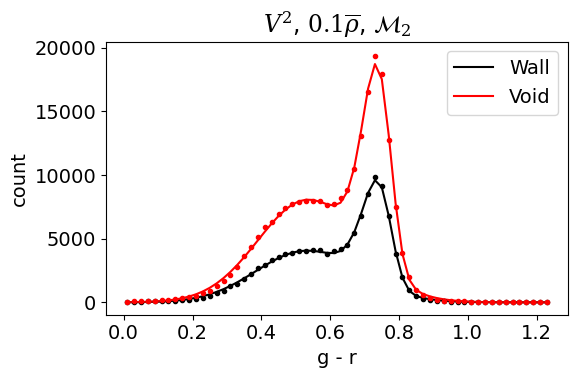

In [77]:
Model_2_plot(V2_0p1_gr_bestfit2, 
             gr_NSA[wall_0p1], 
             gr_NSA[void_0p1], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [79]:
lnB12_V2_0p1 = lnzM1_V2_0p1 - lnzM2_V2_0p1

B12_V2_0p1 = np.exp(lnB12_V2_0p1)

print('V2 g-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p1, lnB12_V2_0p1*np.log10(np.exp(1))))

V2 g-r: B12 = 4.2e+05; log(B12) = 5.623


## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [80]:
temp_infile = open('pocoMC_results/sampler_results_M1_g-r_V2-0p3.pickle', 'rb')
V2_0p3_results1 = pickle.load(temp_infile)
temp_infile.close()

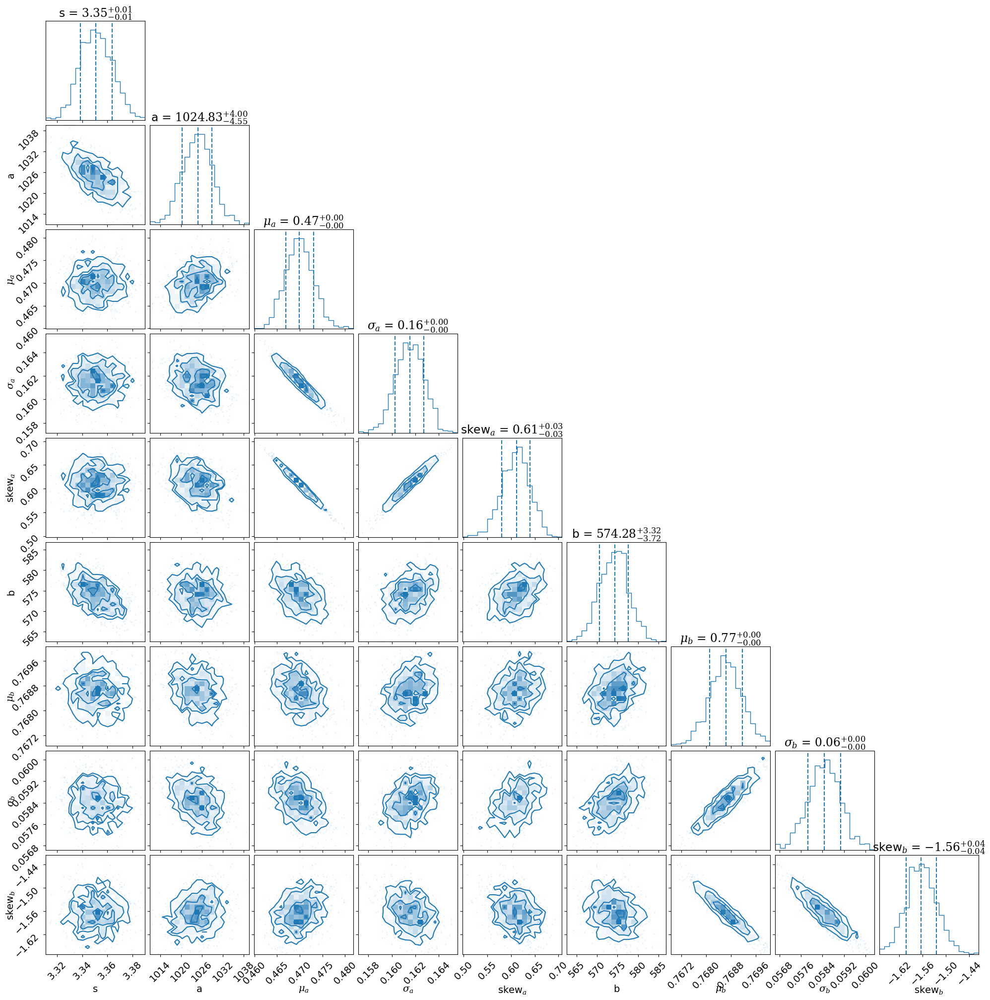

In [81]:
pc.plotting.corner(V2_0p3_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [82]:
lnzM1_V2_0p3 = V2_0p3_results1['logz'][-1]
lnzM1_V2_0p3

-2020.4433580998866

In [83]:
V2_0p3_gr_bestfit1 = np.mean(V2_0p3_results1['samples'], axis=0)

V2_0p3_gr_bestfit1

array([ 3.3511791e+00,  1.0247125e+03,  4.6996072e-01,  1.6151381e-01,
        6.0967201e-01,  5.7415924e+02,  7.6863009e-01,  5.8463104e-02,
       -1.5625373e+00], dtype=float32)

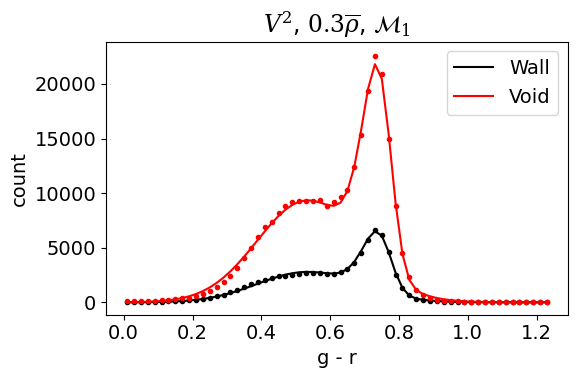

In [84]:
Model_1_plot(V2_0p3_gr_bestfit1, 
             gr_NSA[wall_0p3], 
             gr_NSA[void_0p3], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [85]:
temp_infile = open('pocoMC_results/sampler_results_M2_g-r_V2-0p3.pickle', 'rb')
V2_0p3_results2 = pickle.load(temp_infile)
temp_infile.close()

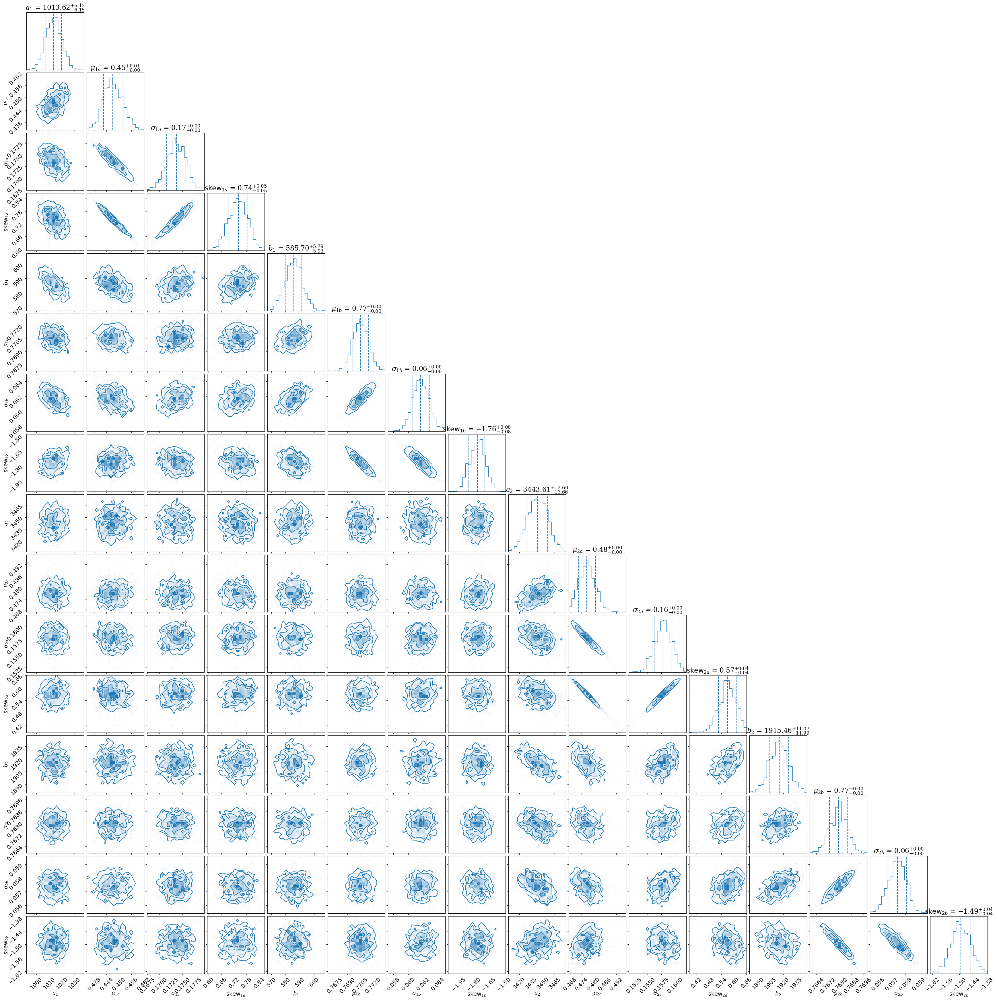

In [86]:
pc.plotting.corner(V2_0p3_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [87]:
lnzM2_V2_0p3 = V2_0p3_results2['logz'][-1]
lnzM1_V2_0p3

-2020.4433580998866

In [88]:
V2_0p3_gr_bestfit2 = np.mean(V2_0p3_results2['samples'], axis=0)

V2_0p3_gr_bestfit2

array([ 1.01365576e+03,  4.47178066e-01,  1.73697039e-01,  7.39807189e-01,
        5.85750427e+02,  7.70563304e-01,  6.17372878e-02, -1.76517522e+00,
        3.44339209e+03,  4.76959020e-01,  1.57797202e-01,  5.68355680e-01,
        1.91513721e+03,  7.67893136e-01,  5.74074537e-02, -1.49281502e+00],
      dtype=float32)

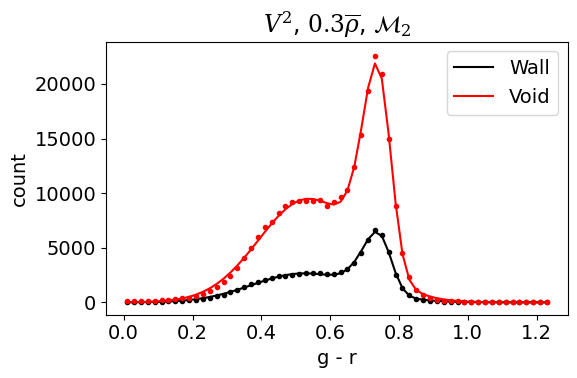

In [89]:
Model_2_plot(V2_0p3_gr_bestfit2, 
             gr_NSA[wall_0p3], 
             gr_NSA[void_0p3], 
             gr_bins, 
             2, 
             xlabel_text='g - r', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [90]:
lnB12_V2_0p3 = lnzM1_V2_0p3 - lnzM2_V2_0p3

B12_V2_0p3 = np.exp(lnB12_V2_0p3)

print('V2 g-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p3, lnB12_V2_0p3*np.log10(np.exp(1))))

V2 g-r: B12 = 2.72e-61; log(B12) = -60.565
